<a href="https://www.kaggle.com/code/omborse771924/heart-disease-risk-2026-eda?scriptVersionId=336507271" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

sns.set_style("whitegrid")


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/uditjain13/heart-disease-risk-2026/heart_disease_risk_2026.csv


## Loading Dataset

In [2]:
df = pd.read_csv('/kaggle/input/datasets/uditjain13/heart-disease-risk-2026/heart_disease_risk_2026.csv')

In [3]:
df.head()

,patient_id,age,sex,resting_bp_systolic,resting_bp_diastolic,cholesterol_total,hdl,ldl,triglycerides,fasting_blood_sugar,...,family_history,smoker_status,alcohol_units_per_week,exercise_minutes_per_week,sleep_hours,stress_score,wearable_owner,daily_steps,diet_quality_score,has_heart_disease
0,1,44,Male,117,74,193,57,106,119,112,...,False,Never,2.9,86,5.4,19.8,True,7731,62.9,0
1,2,57,Male,139,94,185,69,110,35,114,...,False,Never,3.0,132,4.3,45.8,True,2629,74.6,1
2,3,29,Male,128,78,197,52,108,157,95,...,False,Current,3.5,128,5.1,17.7,True,9290,65.7,0
3,4,72,Male,132,86,197,59,104,143,92,...,False,Never,2.7,18,6.8,63.6,True,7373,48.5,1
4,5,62,Female,116,75,154,65,75,104,135,...,True,Former,3.3,24,8.2,58.7,False,6331,47.3,1


In [4]:
df.tail()

,patient_id,age,sex,resting_bp_systolic,resting_bp_diastolic,cholesterol_total,hdl,ldl,triglycerides,fasting_blood_sugar,...,family_history,smoker_status,alcohol_units_per_week,exercise_minutes_per_week,sleep_hours,stress_score,wearable_owner,daily_steps,diet_quality_score,has_heart_disease
8995,8996,36,Female,108,63,178,68,82,158,96,...,False,Never,13.0,306,8.6,51.1,False,7144,58.1,0
8996,8997,44,Female,112,73,213,54,139,102,125,...,False,Former,3.4,76,6.5,37.1,False,7395,68.9,0
8997,8998,57,Female,144,93,198,66,113,79,102,...,False,Never,3.9,194,6.2,46.3,False,7424,70.2,0
8998,8999,61,Female,130,70,220,68,135,109,104,...,False,Former,3.9,139,5.0,66.5,False,5716,43.8,1
8999,9000,63,Female,152,104,215,64,117,109,120,...,False,Never,7.3,95,8.8,54.1,False,3860,54.5,0


In [5]:
df.info

<bound method DataFrame.info of       patient_id  age     sex  resting_bp_systolic  resting_bp_diastolic  \
0              1   44    Male                  117                    74   
1              2   57    Male                  139                    94   
2              3   29    Male                  128                    78   
3              4   72    Male                  132                    86   
4              5   62  Female                  116                    75   
...          ...  ...     ...                  ...                   ...   
8995        8996   36  Female                  108                    63   
8996        8997   44  Female                  112                    73   
8997        8998   57  Female                  144                    93   
8998        8999   61  Female                  130                    70   
8999        9000   63  Female                  152                   104   

      cholesterol_total  hdl  ldl  triglycerides  fasti

In [6]:
df.isnull()

,patient_id,age,sex,resting_bp_systolic,resting_bp_diastolic,cholesterol_total,hdl,ldl,triglycerides,fasting_blood_sugar,...,family_history,smoker_status,alcohol_units_per_week,exercise_minutes_per_week,sleep_hours,stress_score,wearable_owner,daily_steps,diet_quality_score,has_heart_disease
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [7]:
df.isnull().sum()

patient_id                   0
age                          0
sex                          0
resting_bp_systolic          0
resting_bp_diastolic         0
cholesterol_total            0
hdl                          0
ldl                          0
triglycerides                0
fasting_blood_sugar          0
hba1c                        0
bmi                          0
resting_heart_rate           0
max_heart_rate_achieved      0
chest_pain_type              0
exercise_induced_angina      0
st_depression                0
family_history               0
smoker_status                0
alcohol_units_per_week       0
exercise_minutes_per_week    0
sleep_hours                  0
stress_score                 0
wearable_owner               0
daily_steps                  0
diet_quality_score           0
has_heart_disease            0
dtype: int64

In [8]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
8995    False
8996    False
8997    False
8998    False
8999    False
Length: 9000, dtype: bool

In [9]:
df.duplicated().sum()

np.int64(0)

In [10]:
df.columns

Index(['patient_id', 'age', 'sex', 'resting_bp_systolic',
       'resting_bp_diastolic', 'cholesterol_total', 'hdl', 'ldl',
       'triglycerides', 'fasting_blood_sugar', 'hba1c', 'bmi',
       'resting_heart_rate', 'max_heart_rate_achieved', 'chest_pain_type',
       'exercise_induced_angina', 'st_depression', 'family_history',
       'smoker_status', 'alcohol_units_per_week', 'exercise_minutes_per_week',
       'sleep_hours', 'stress_score', 'wearable_owner', 'daily_steps',
       'diet_quality_score', 'has_heart_disease'],
      dtype='object')

## EDA

DATASET SHAPE
(9000, 27)
DATASET INFO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   patient_id                 9000 non-null   int64  
 1   age                        9000 non-null   int64  
 2   sex                        9000 non-null   object 
 3   resting_bp_systolic        9000 non-null   int64  
 4   resting_bp_diastolic       9000 non-null   int64  
 5   cholesterol_total          9000 non-null   int64  
 6   hdl                        9000 non-null   int64  
 7   ldl                        9000 non-null   int64  
 8   triglycerides              9000 non-null   int64  
 9   fasting_blood_sugar        9000 non-null   int64  
 10  hba1c                      9000 non-null   float64
 11  bmi                        9000 non-null   float64
 12  resting_heart_rate         9000 non-null   int64  
 13  max_heart_

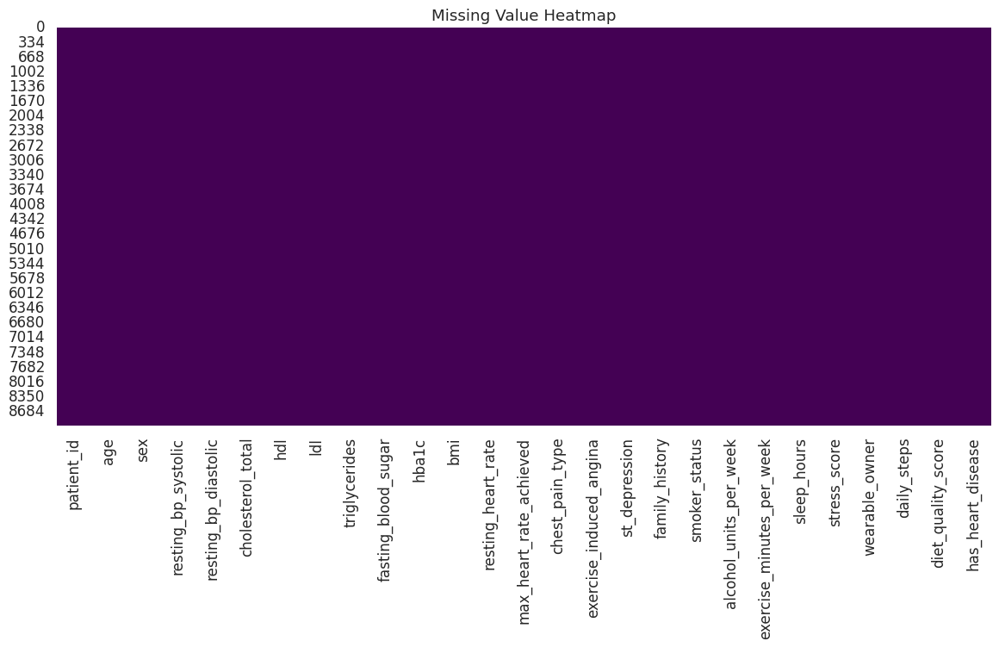

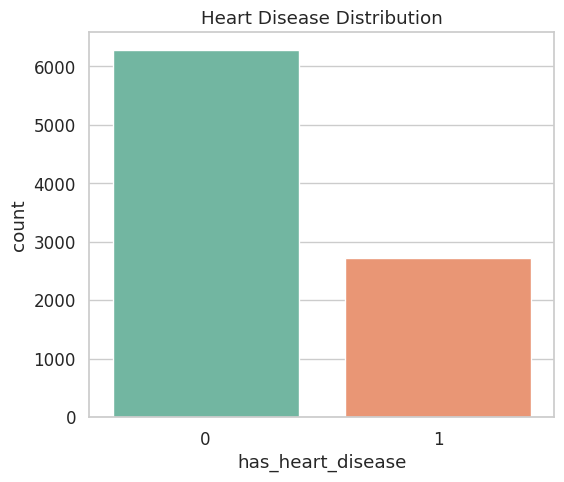

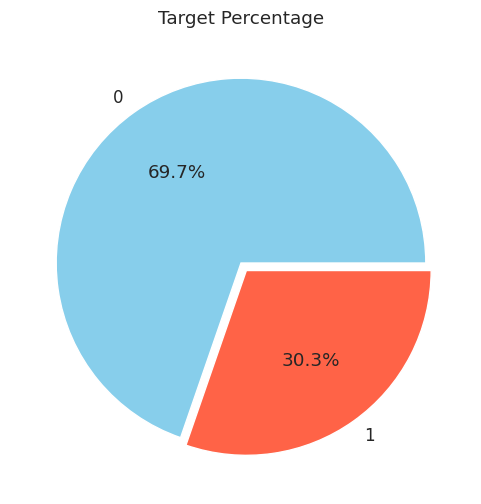


Generating Histograms...


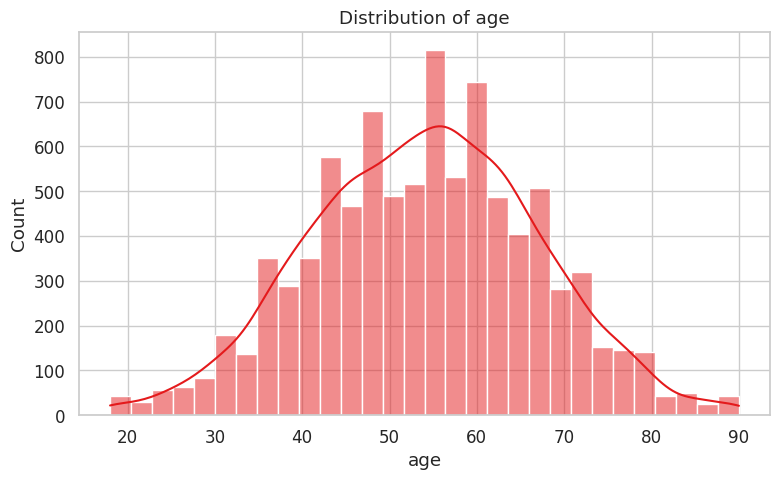

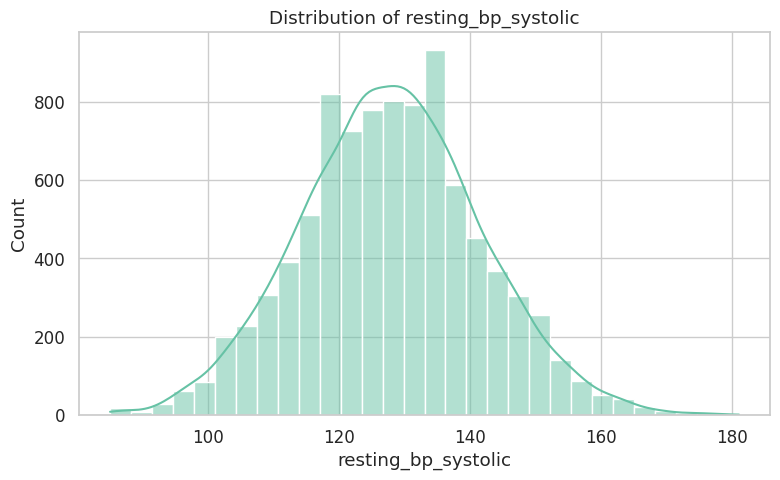

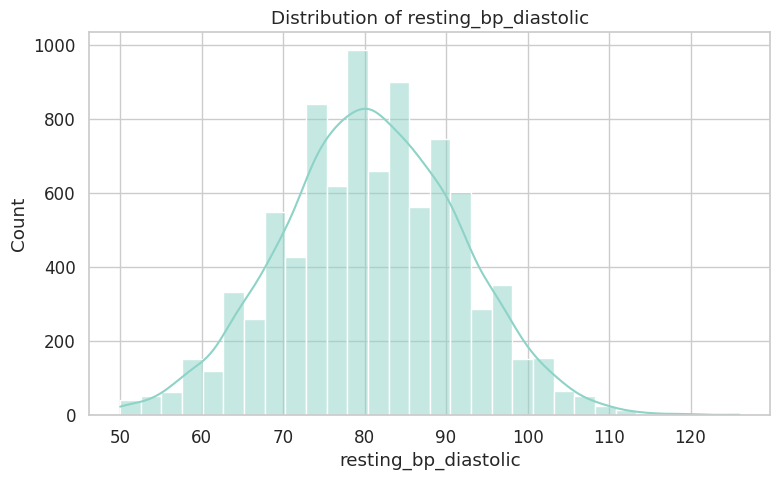

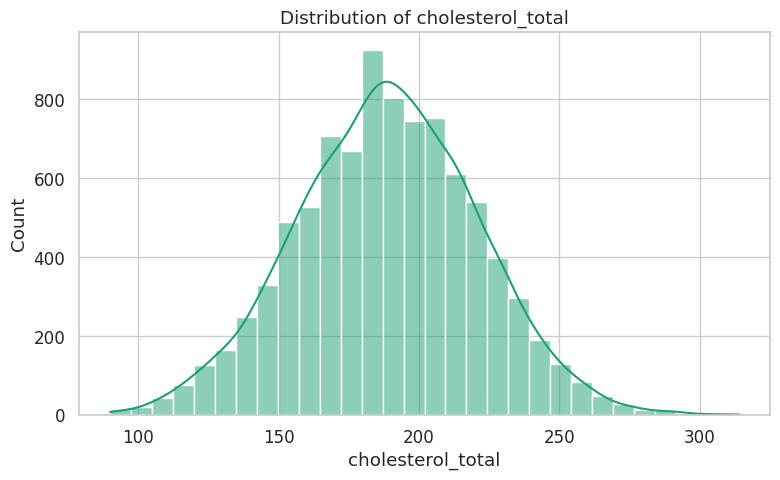

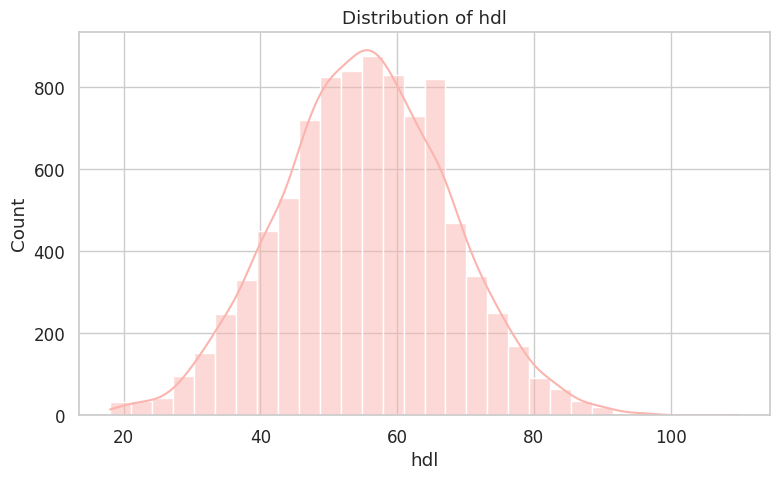

...

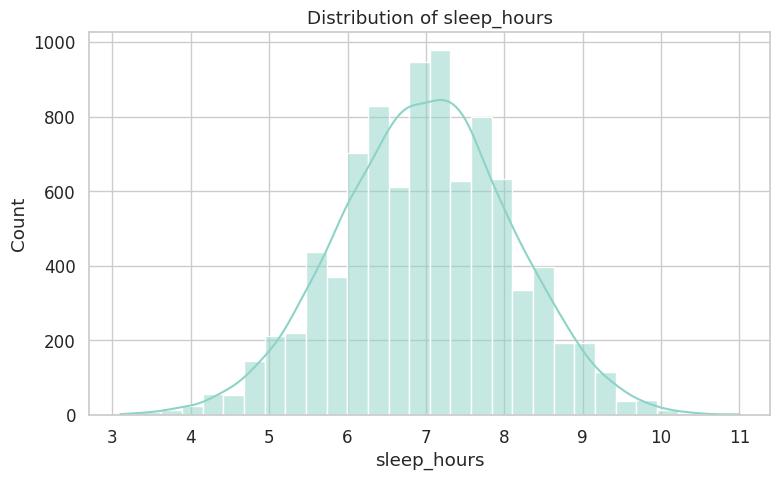

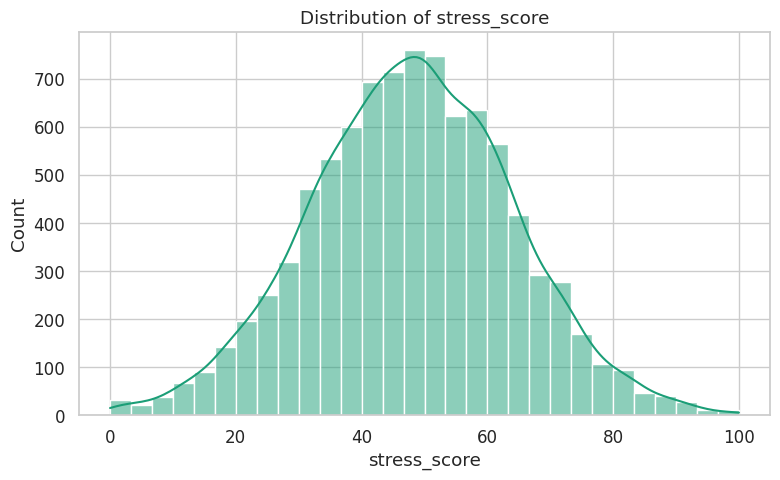

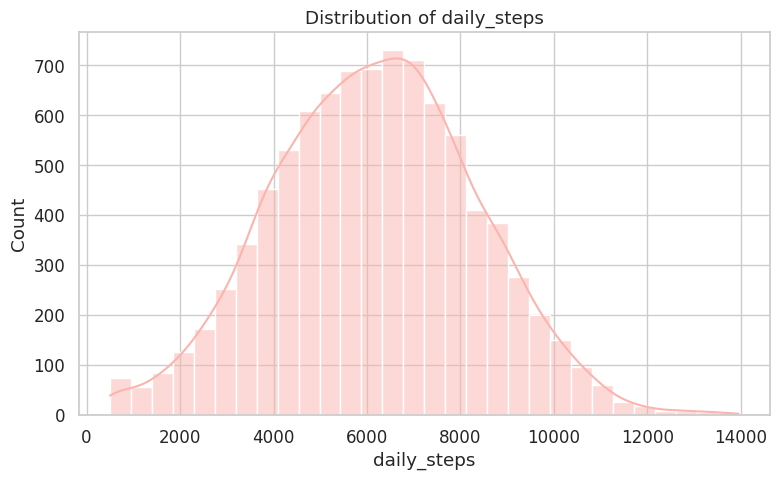

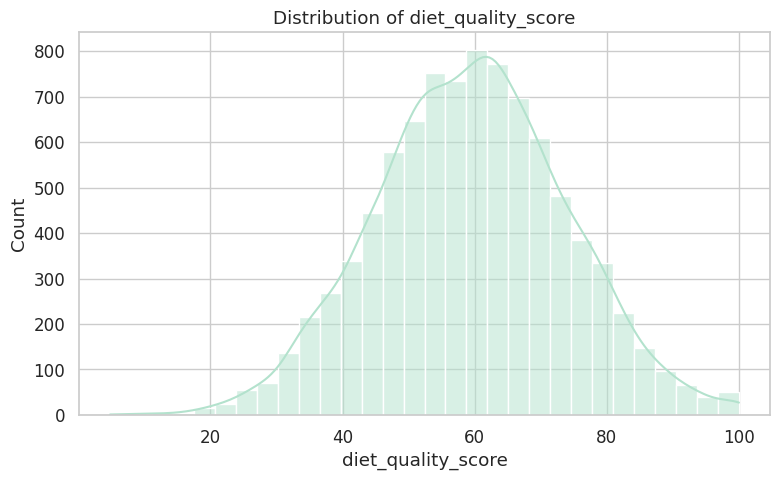

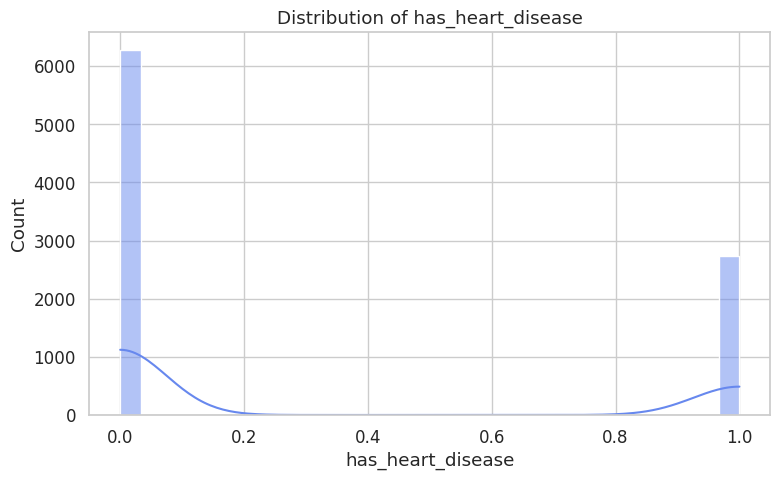


Generating Boxplots...


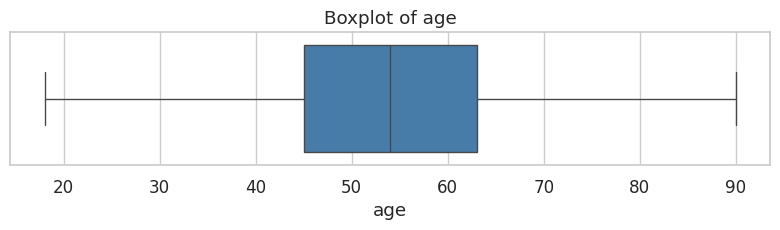

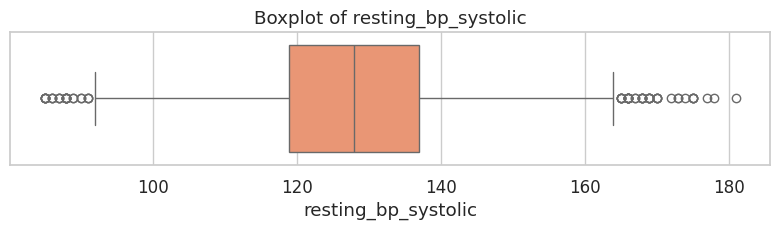

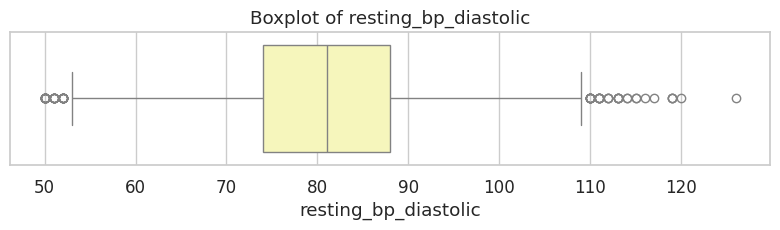

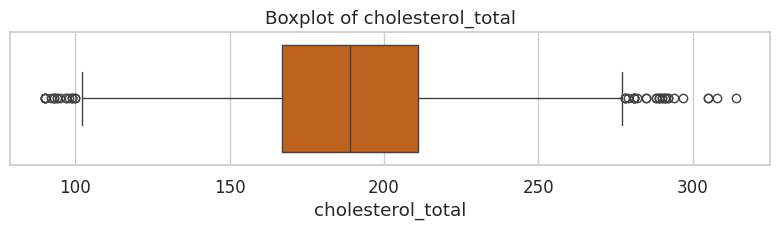

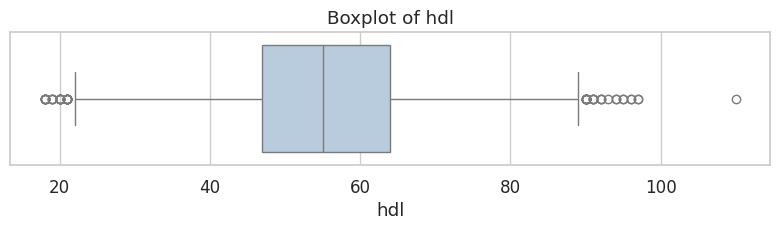

...

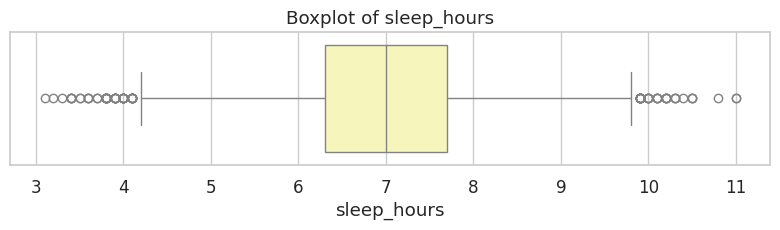

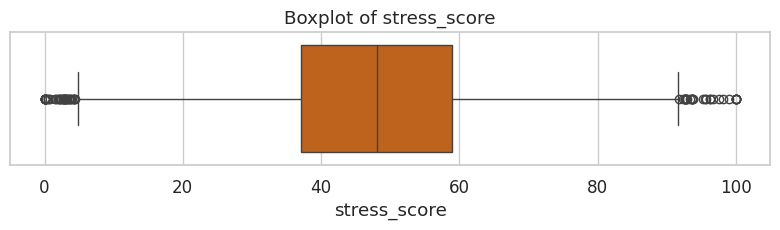

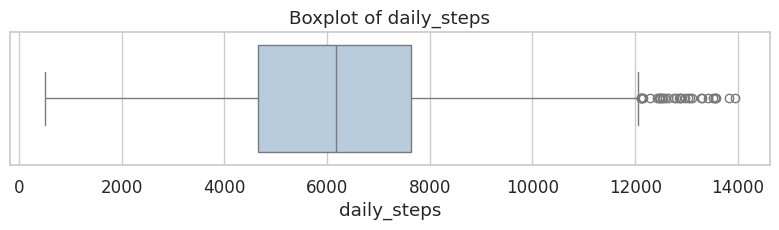

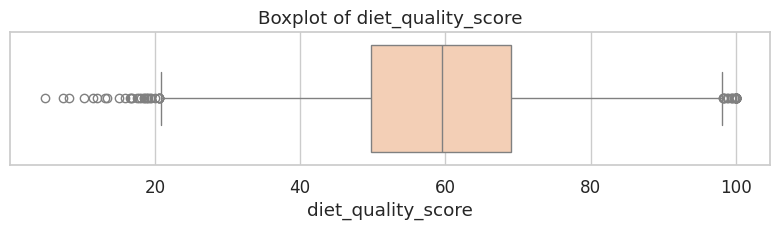

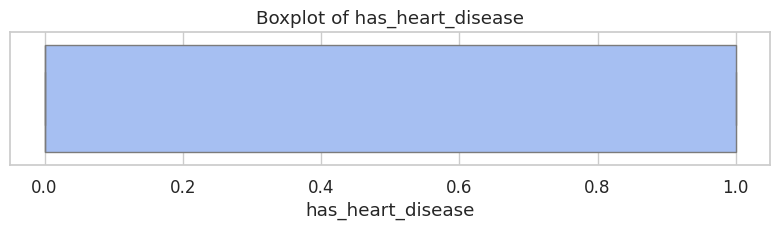


Generating Violin Plots...


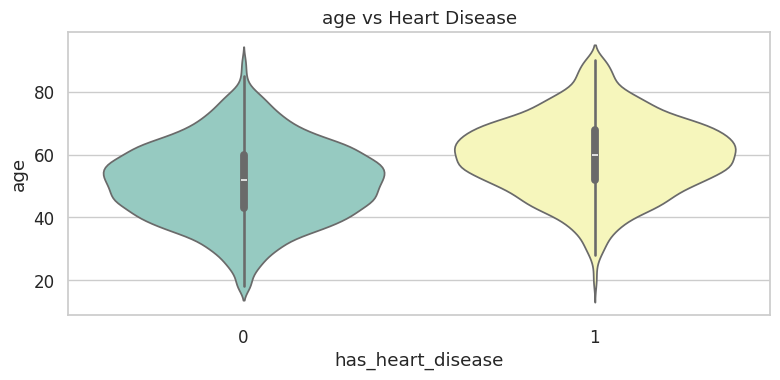

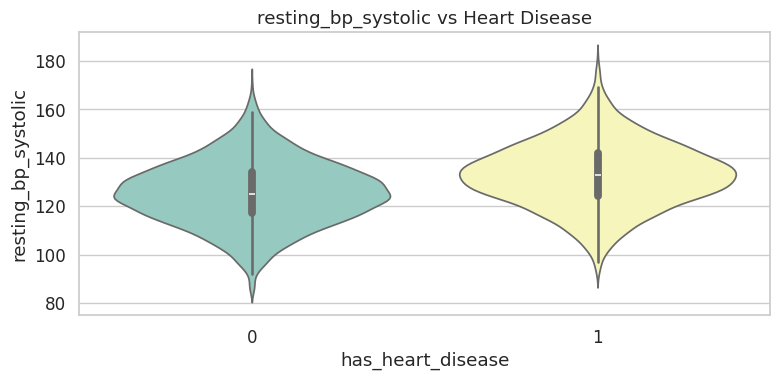

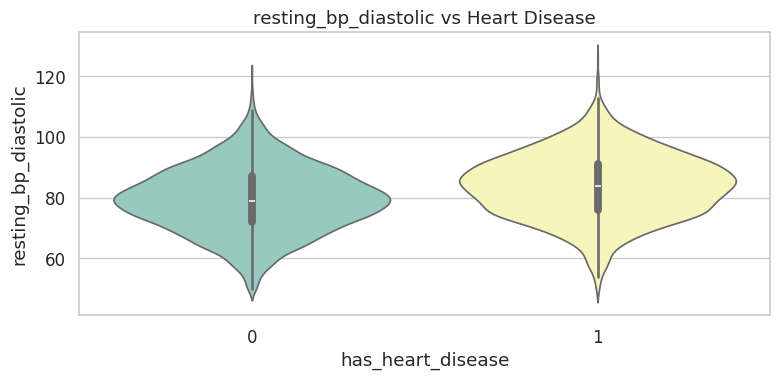

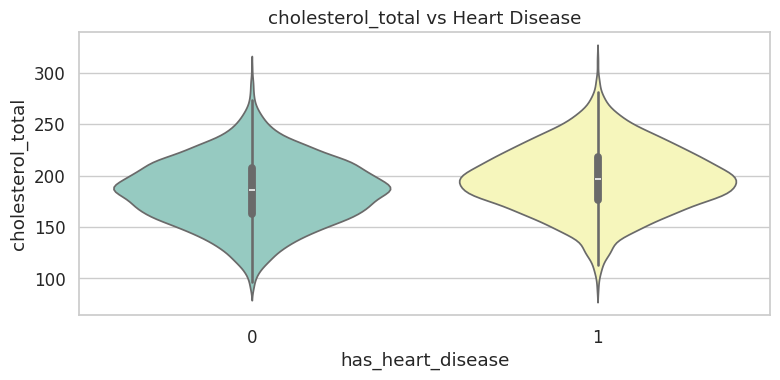

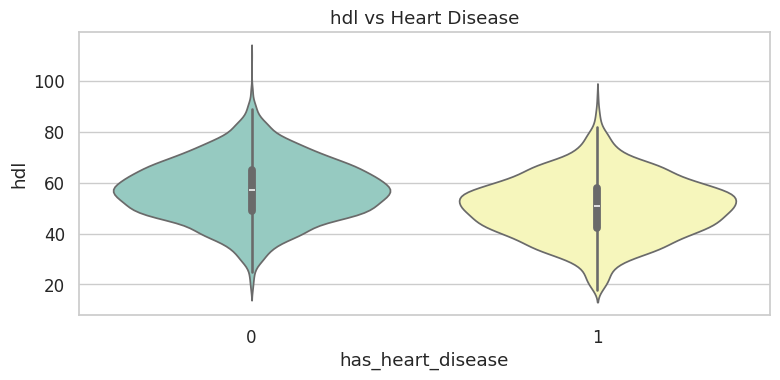

...

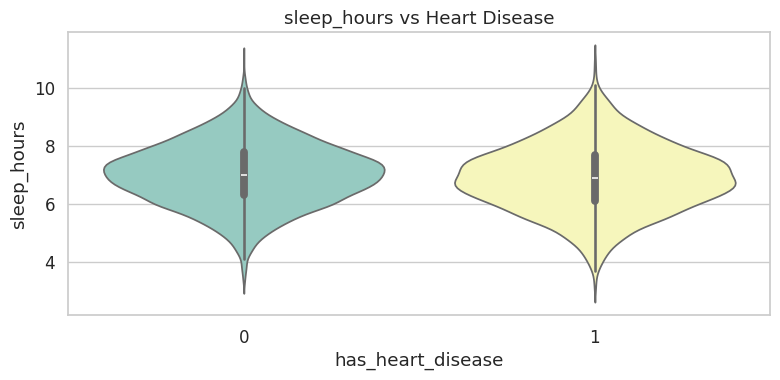

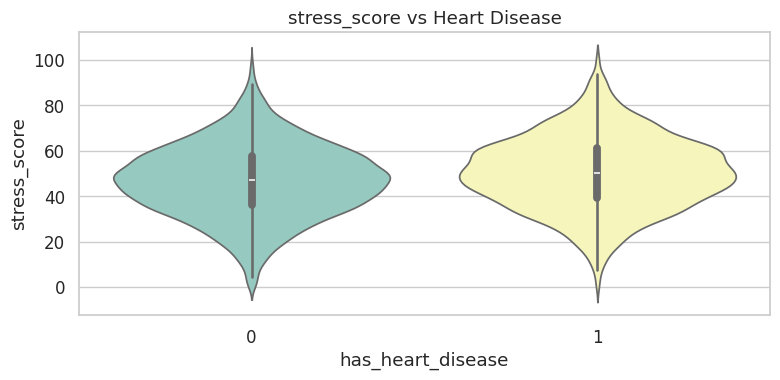

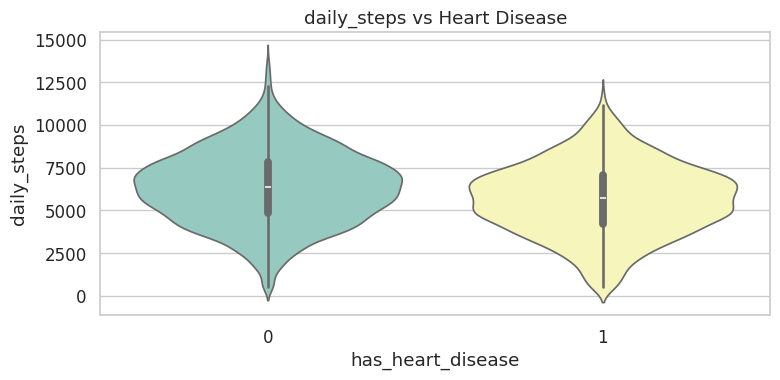

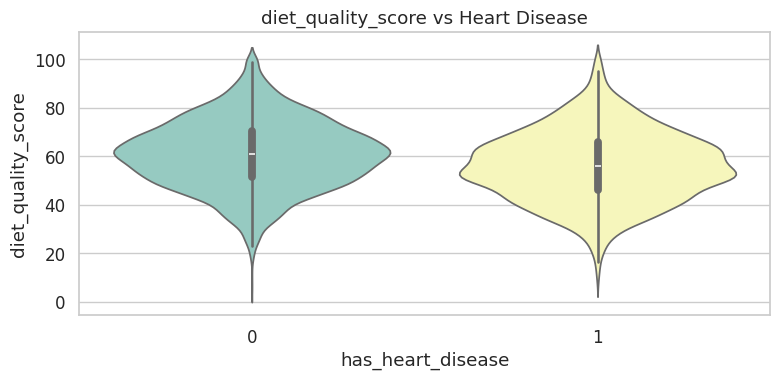

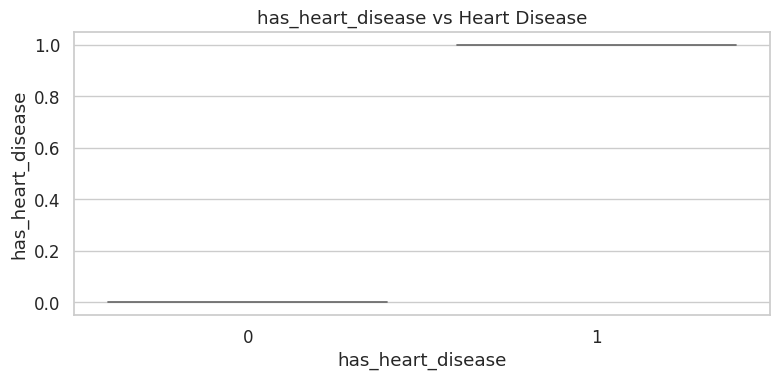


Generating KDE Plots...


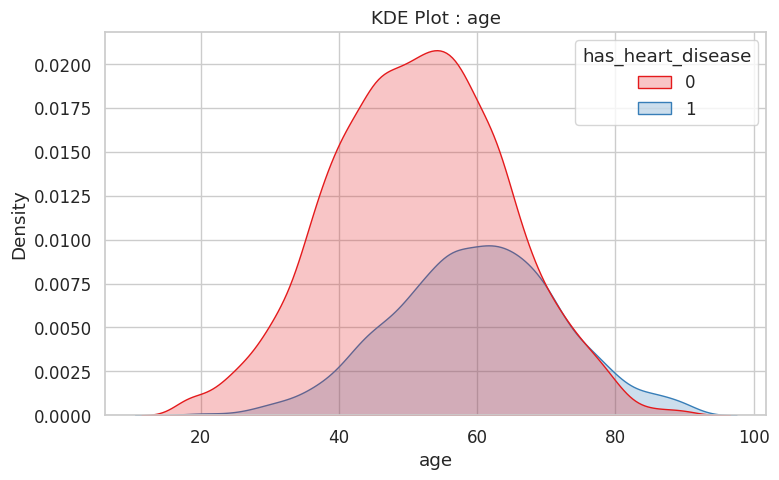

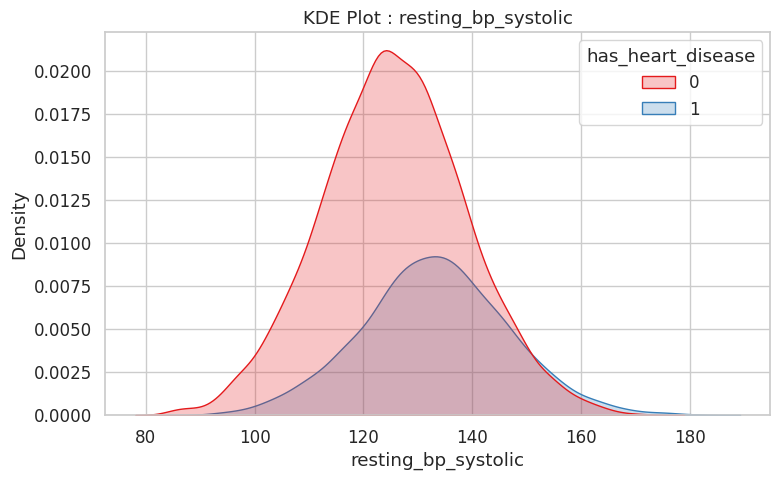

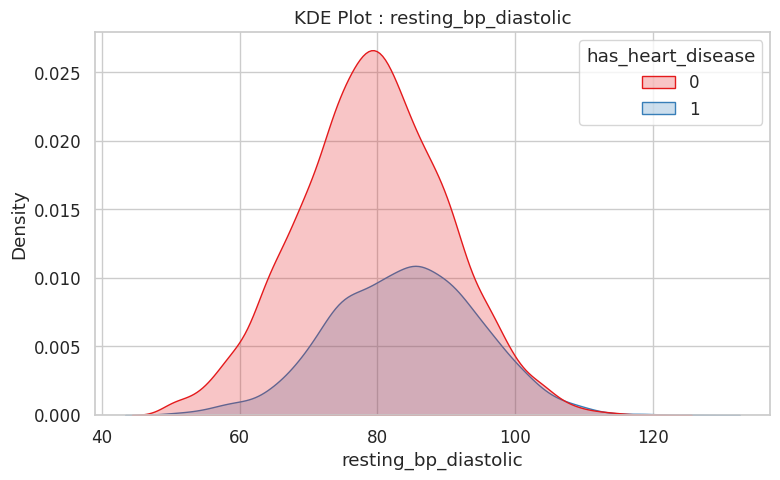

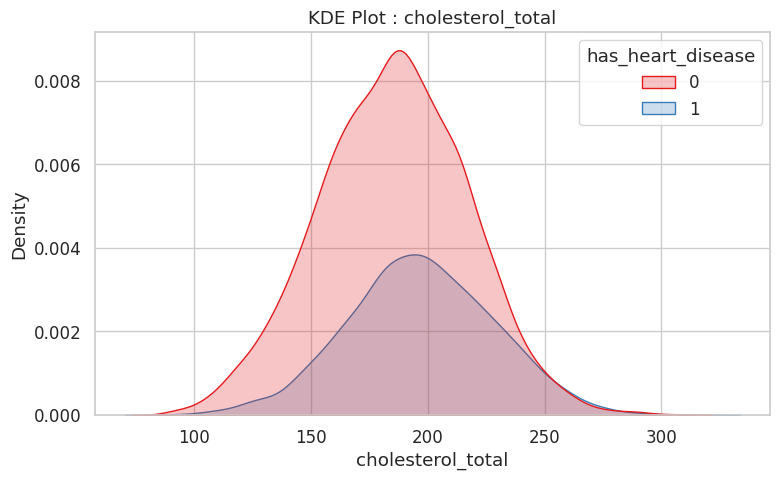

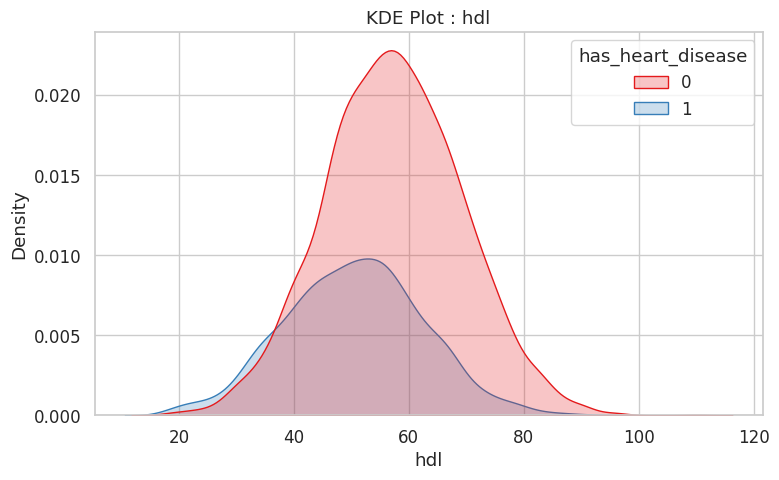

...

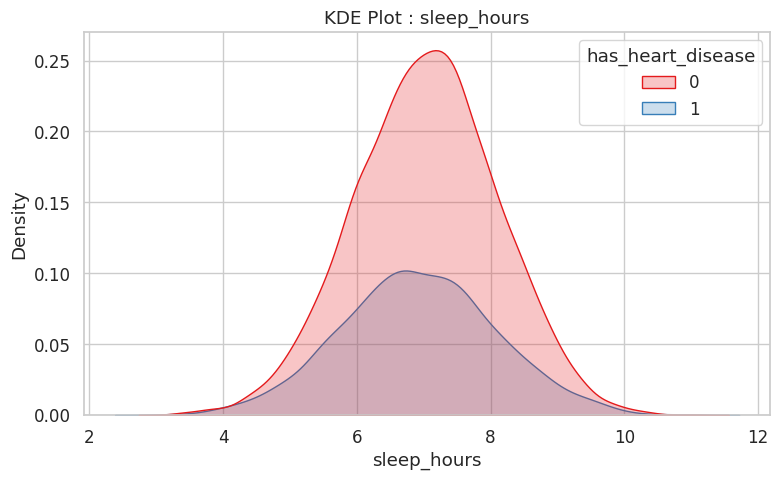

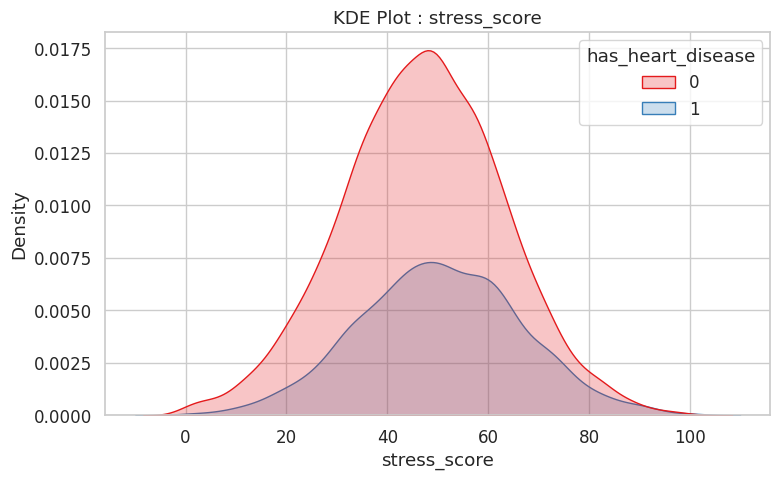

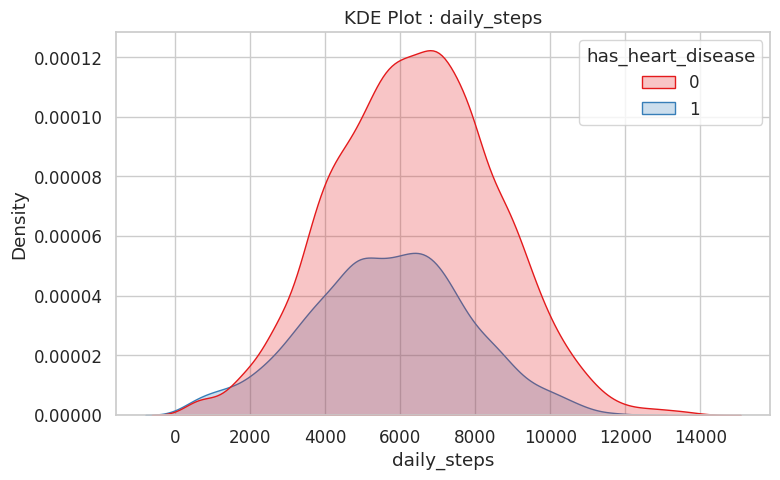

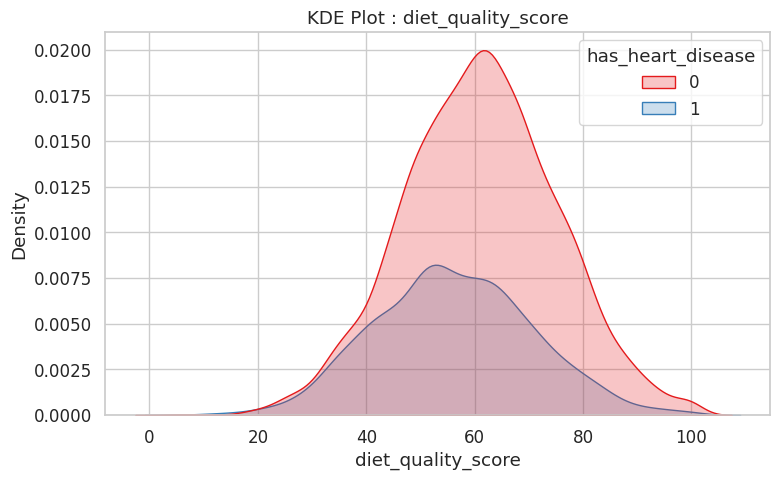

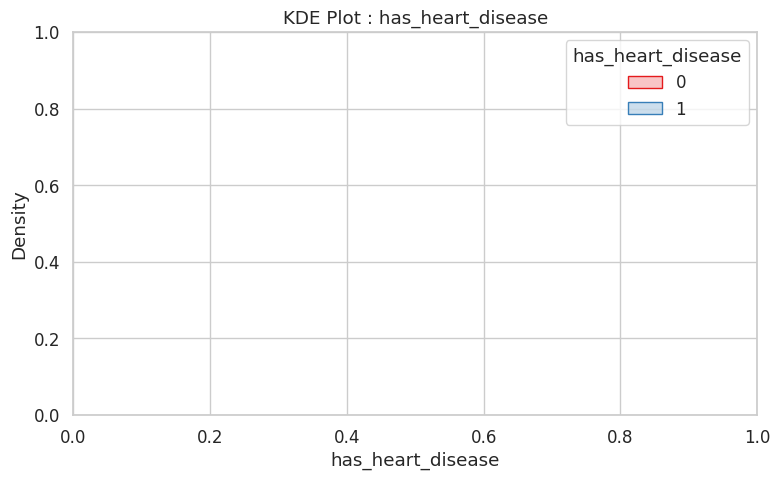


Generating Countplots...


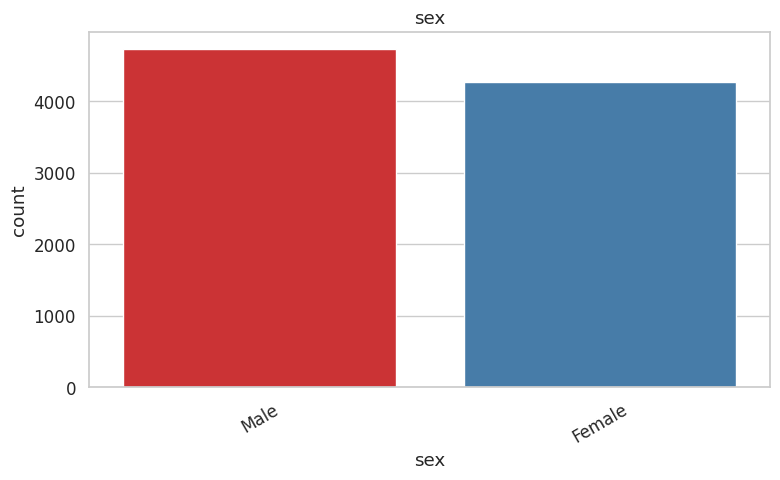

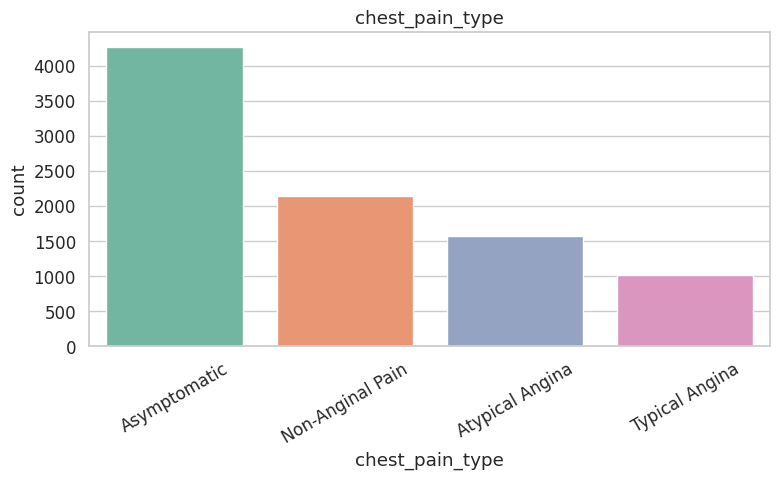

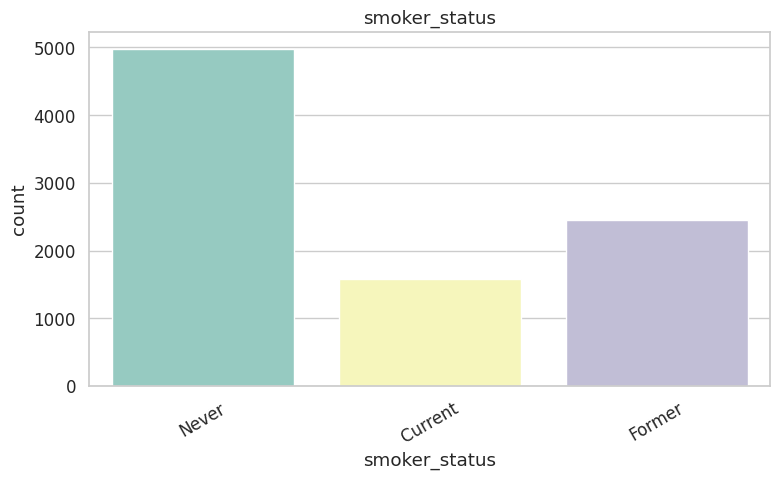


Generating Categorical vs Target...


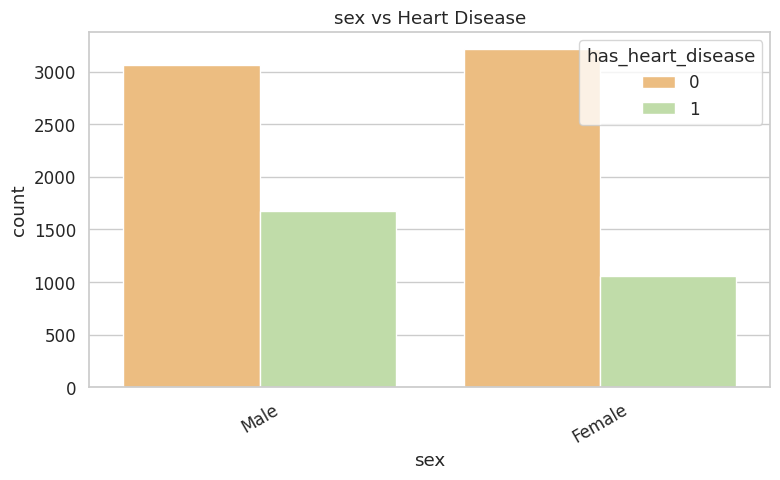

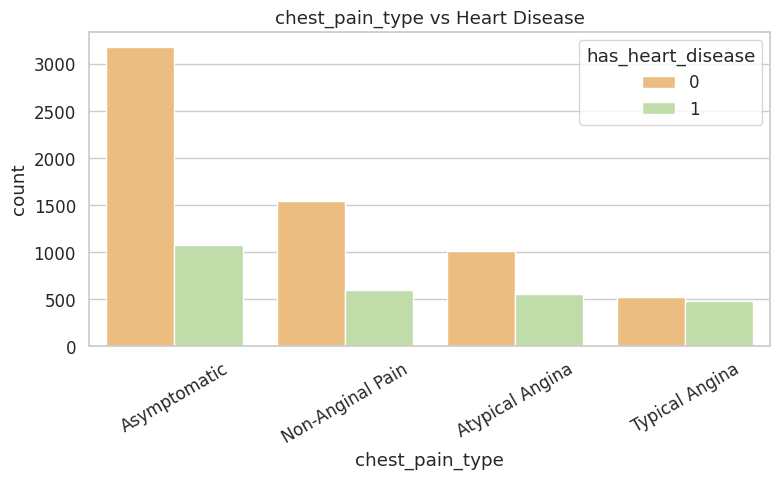

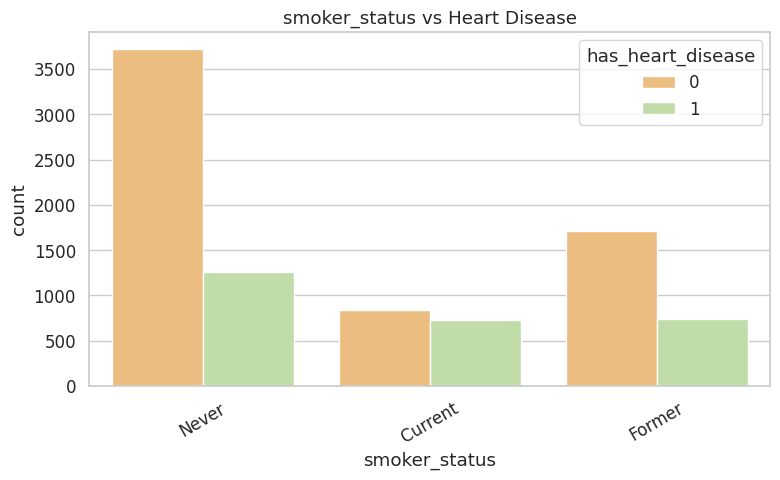

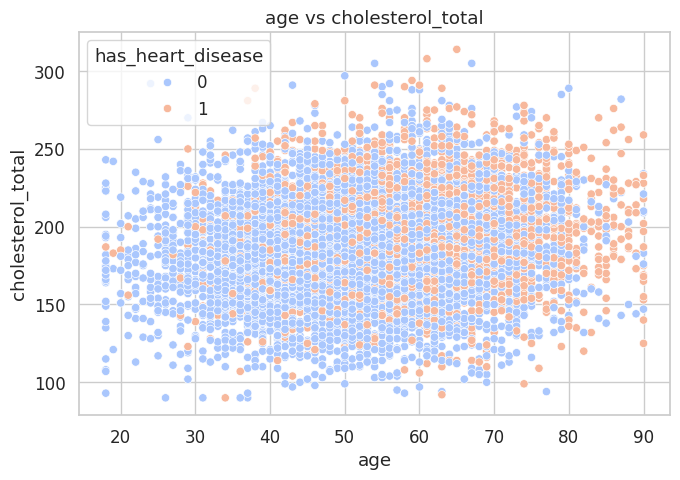

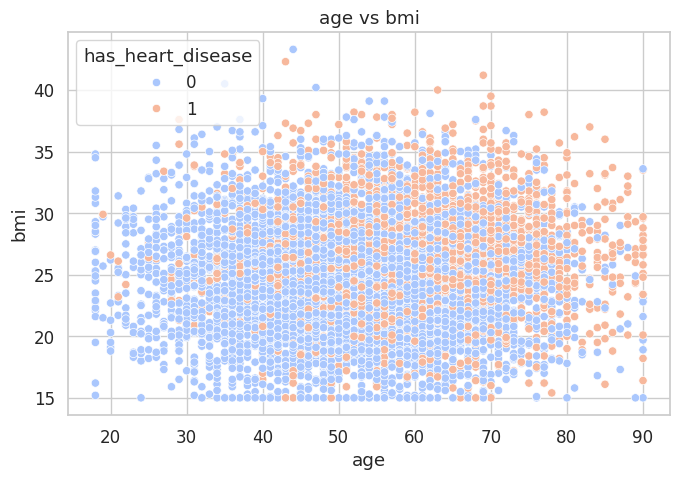

...

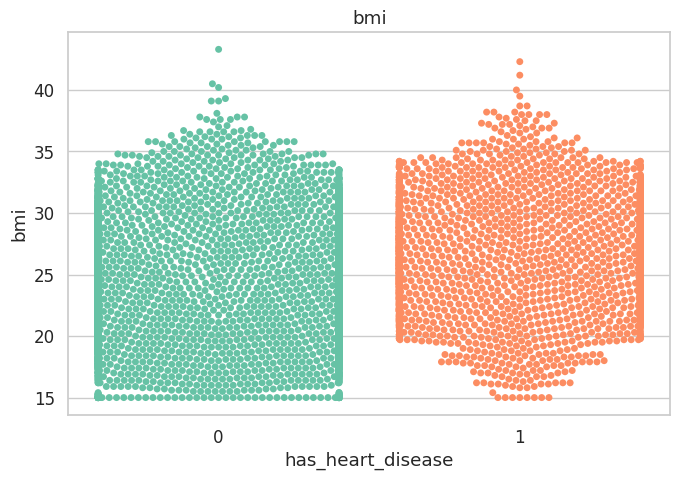

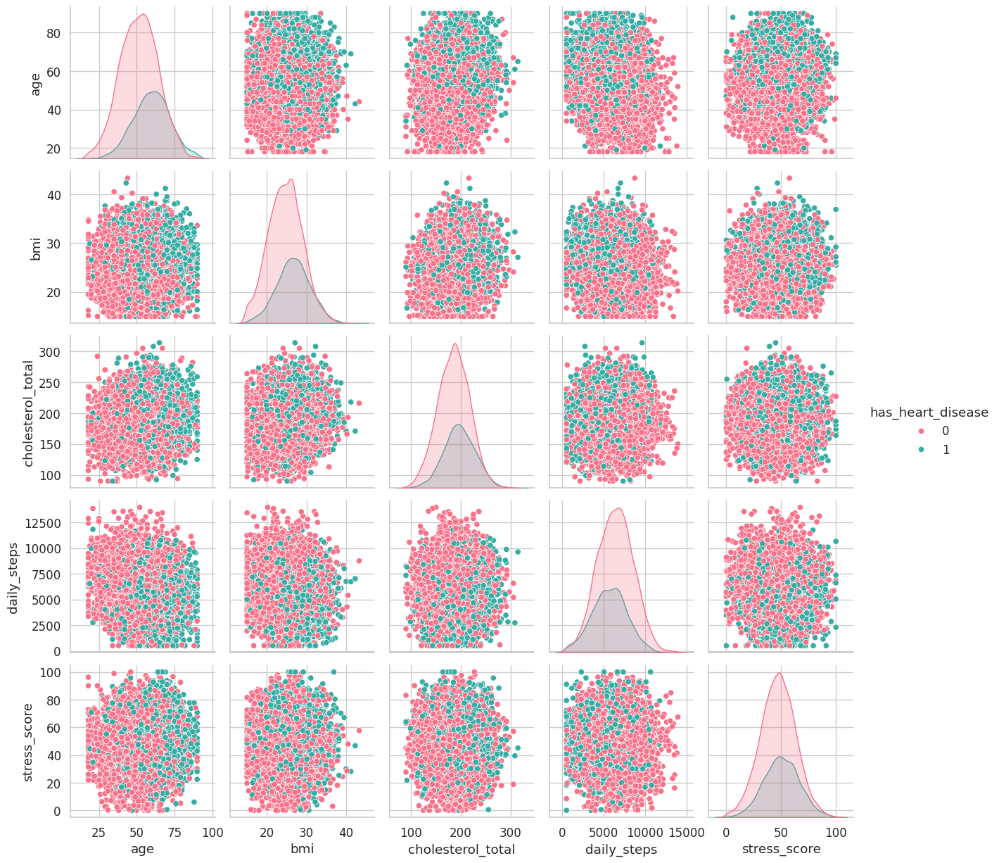

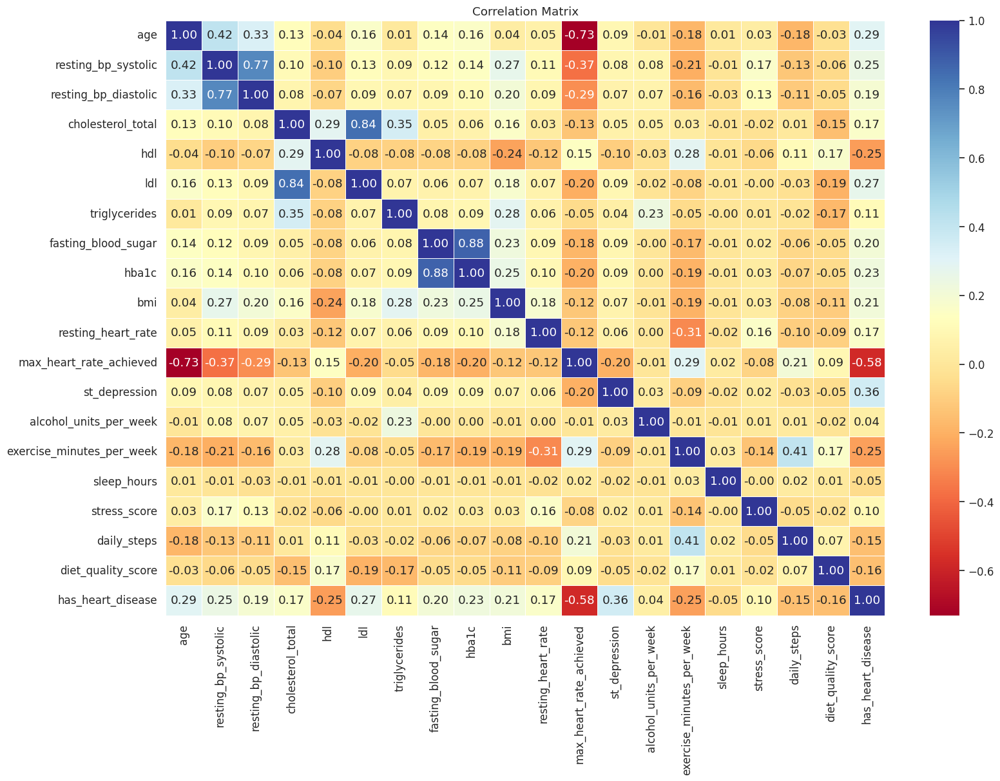

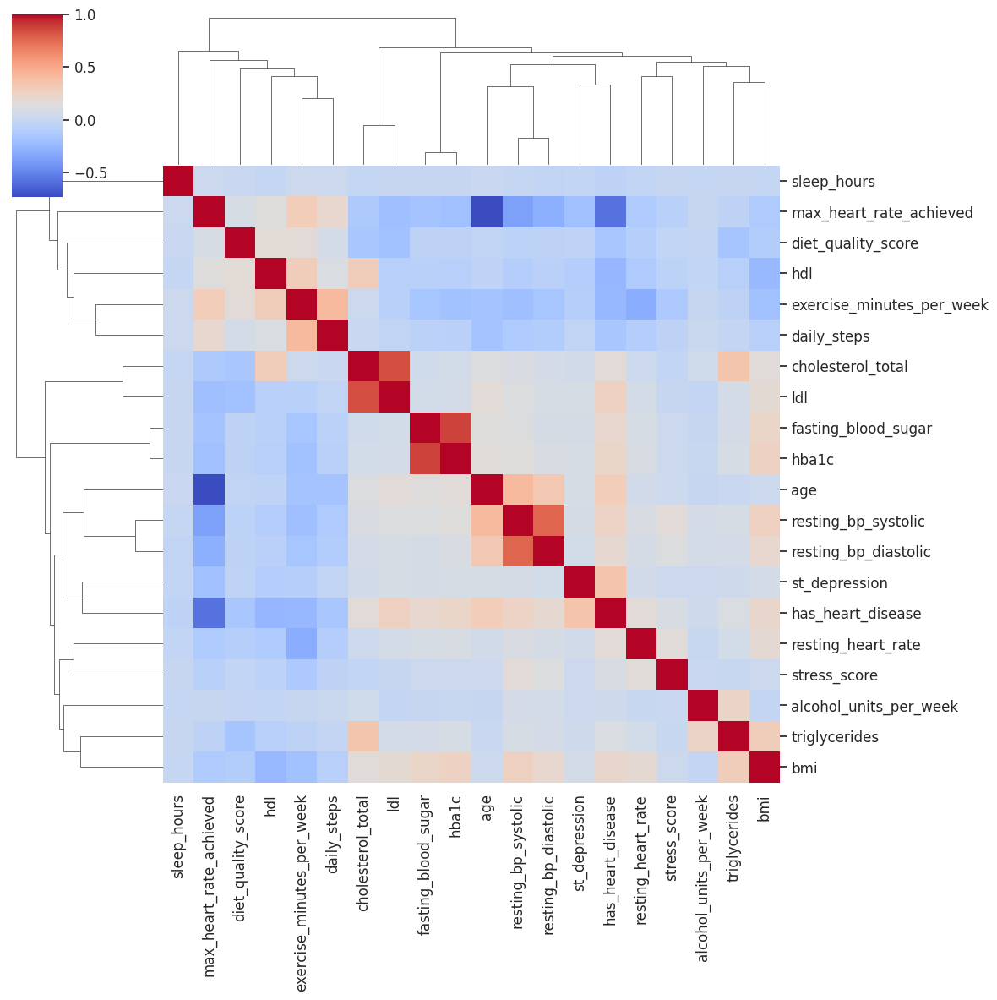

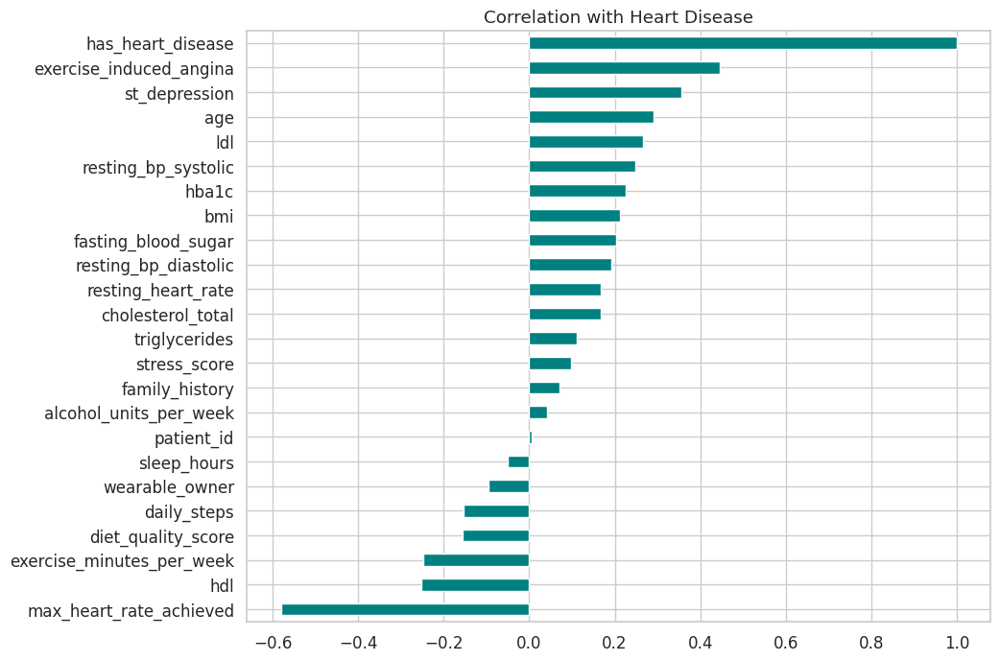



 COMPLETE EDA VISUALIZATION FINISHED SUCCESSFULLY 


In [11]:
# ============================================================
# HEART DISEASE DATASET - COMPLETE EDA VISUALIZATION
# ============================================================

# ==========================
# IMPORT LIBRARIES
# ==========================

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("ggplot")
sns.set(style="whitegrid", font_scale=1.1)


# ==========================
# BASIC INFORMATION
# ==========================

print("="*60)
print("DATASET SHAPE")
print(df.shape)

print("="*60)
print("DATASET INFO")
print(df.info())

print("="*60)
print("FIRST 5 ROWS")
print(df.head())

print("="*60)
print("LAST 5 ROWS")
print(df.tail())

print("="*60)
print("MISSING VALUES")
print(df.isnull().sum())

print("="*60)
print("DUPLICATE ROWS :", df.duplicated().sum())

print("="*60)
print("STATISTICAL SUMMARY")
print(df.describe(include="all"))

# ============================================================
# MISSING VALUE HEATMAP
# ============================================================

plt.figure(figsize=(14,6))
sns.heatmap(df.isnull(), cmap="viridis", cbar=False)
plt.title("Missing Value Heatmap")
plt.show()

# ============================================================
# TARGET DISTRIBUTION
# ============================================================

plt.figure(figsize=(6,5))
sns.countplot(data=df, x="has_heart_disease", palette="Set2")
plt.title("Heart Disease Distribution")
plt.show()

plt.figure(figsize=(6,6))
df["has_heart_disease"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    colors=["skyblue","tomato"],
    explode=[0,0.05]
)
plt.ylabel("")
plt.title("Target Percentage")
plt.show()

# ============================================================
# NUMERICAL & CATEGORICAL COLUMNS
# ============================================================

num_cols = df.select_dtypes(include=np.number).columns.tolist()

if "patient_id" in num_cols:
    num_cols.remove("patient_id")

cat_cols = df.select_dtypes(include=["object","category"]).columns.tolist()

palettes = [
    "Set1","Set2","Set3","Dark2","Pastel1","Pastel2",
    "coolwarm","viridis","plasma","magma",
    "Spectral","Accent","tab10"
]

# ============================================================
# HISTOGRAMS
# ============================================================

print("\nGenerating Histograms...")

for i,col in enumerate(num_cols):

    plt.figure(figsize=(8,5))

    sns.histplot(
        df[col],
        kde=True,
        bins=30,
        color=sns.color_palette(palettes[i%len(palettes)])[0]
    )

    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()

# ============================================================
# BOXPLOTS
# ============================================================

print("\nGenerating Boxplots...")

for i,col in enumerate(num_cols):

    plt.figure(figsize=(8,2.5))

    sns.boxplot(
        x=df[col],
        color=sns.color_palette(palettes[i%len(palettes)])[1]
    )

    plt.title(f"Boxplot of {col}")
    plt.tight_layout()
    plt.show()

# ============================================================
# VIOLIN PLOTS
# ============================================================

print("\nGenerating Violin Plots...")

for i,col in enumerate(num_cols):

    plt.figure(figsize=(8,4))

    sns.violinplot(
        data=df,
        x="has_heart_disease",
        y=col,
        palette="Set3"
    )

    plt.title(f"{col} vs Heart Disease")
    plt.tight_layout()
    plt.show()

# ============================================================
# KDE PLOTS
# ============================================================

print("\nGenerating KDE Plots...")

for col in num_cols:

    plt.figure(figsize=(8,5))

    sns.kdeplot(
        data=df,
        x=col,
        hue="has_heart_disease",
        fill=True,
        palette="Set1"
    )

    plt.title(f"KDE Plot : {col}")
    plt.tight_layout()
    plt.show()

# ============================================================
# CATEGORICAL COUNTPLOTS
# ============================================================

print("\nGenerating Countplots...")

for i,col in enumerate(cat_cols):

    plt.figure(figsize=(8,5))

    sns.countplot(
        data=df,
        x=col,
        palette=palettes[i%len(palettes)]
    )

    plt.xticks(rotation=30)
    plt.title(col)
    plt.tight_layout()
    plt.show()

# ============================================================
# CATEGORICAL VS TARGET
# ============================================================

print("\nGenerating Categorical vs Target...")

for i,col in enumerate(cat_cols):

    plt.figure(figsize=(8,5))

    sns.countplot(
        data=df,
        x=col,
        hue="has_heart_disease",
        palette="Spectral"
    )

    plt.xticks(rotation=30)
    plt.title(f"{col} vs Heart Disease")
    plt.tight_layout()
    plt.show()

# ============================================================
# SCATTER PLOTS
# ============================================================

important = [
    ("age","cholesterol_total"),
    ("age","bmi"),
    ("bmi","cholesterol_total"),
    ("daily_steps","bmi"),
    ("exercise_minutes_per_week","bmi"),
    ("stress_score","sleep_hours"),
    ("resting_bp_systolic","resting_bp_diastolic"),
    ("hdl","ldl"),
    ("triglycerides","cholesterol_total")
]

for x,y in important:

    if x in df.columns and y in df.columns:

        plt.figure(figsize=(7,5))

        sns.scatterplot(
            data=df,
            x=x,
            y=y,
            hue="has_heart_disease",
            palette="coolwarm"
        )

        plt.title(f"{x} vs {y}")
        plt.tight_layout()
        plt.show()

# ============================================================
# BARPLOTS OF MEAN VALUES
# ============================================================

for col in num_cols:

    plt.figure(figsize=(7,5))

    sns.barplot(
        data=df,
        x="has_heart_disease",
        y=col,
        palette="viridis"
    )

    plt.title(f"Average {col}")
    plt.tight_layout()
    plt.show()

# ============================================================
# STRIP PLOTS
# ============================================================

for col in ["age","bmi","cholesterol_total","stress_score"]:

    if col in df.columns:

        plt.figure(figsize=(7,5))

        sns.stripplot(
            data=df,
            x="has_heart_disease",
            y=col,
            palette="Dark2",
            jitter=True
        )

        plt.title(col)
        plt.tight_layout()
        plt.show()

# ============================================================
# SWARM PLOTS
# ============================================================

for col in ["age","bmi"]:

    if col in df.columns:

        plt.figure(figsize=(7,5))

        sns.swarmplot(
            data=df,
            x="has_heart_disease",
            y=col,
            palette="Set2"
        )

        plt.title(col)
        plt.tight_layout()
        plt.show()

# ============================================================
# PAIRPLOT
# ============================================================

pair_columns = [
    "age",
    "bmi",
    "cholesterol_total",
    "daily_steps",
    "stress_score",
    "has_heart_disease"
]

pair_columns = [c for c in pair_columns if c in df.columns]

sns.pairplot(
    df[pair_columns],
    hue="has_heart_disease",
    palette="husl"
)

plt.show()

# ============================================================
# CORRELATION HEATMAP
# ============================================================

plt.figure(figsize=(18,12))

corr = df[num_cols].corr()

sns.heatmap(
    corr,
    annot=True,
    cmap="RdYlBu",
    fmt=".2f",
    linewidths=.5
)

plt.title("Correlation Matrix")
plt.show()

# ============================================================
# CORRELATION CLUSTER MAP
# ============================================================

sns.clustermap(
    corr,
    cmap="coolwarm",
    figsize=(12,12),
    annot=False
)

plt.show()

# ============================================================
# FEATURE CORRELATION WITH TARGET
# ============================================================

if "has_heart_disease" in df.columns:

    corr_target = df.corr(numeric_only=True)["has_heart_disease"].sort_values()

    plt.figure(figsize=(10,8))

    corr_target.plot(
        kind="barh",
        color="teal"
    )

    plt.title("Correlation with Heart Disease")
    plt.show()

print("\n")
print("="*70)
print(" COMPLETE EDA VISUALIZATION FINISHED SUCCESSFULLY ")
print("="*70)

## Features Engineeing

In [12]:
# ============================================================
# HEART DISEASE DATASET - PART 1
# Data Loading + Preprocessing + Train-Test Split
# ============================================================

# ==========================
# IMPORT LIBRARIES
# ==========================

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

# Visualization (optional)
import matplotlib.pyplot as plt
import seaborn as sns

# Sklearn
from sklearn.model_selection import train_test_split

from sklearn.compose import ColumnTransformer

from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer

from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler
)


# ============================================================
# BASIC INFORMATION
# ============================================================

print("="*60)
print("Dataset Shape")
print(df.shape)

print("\nColumns")
print(df.columns)

print("\nMissing Values")
print(df.isnull().sum())

print("\nDuplicate Rows :", df.duplicated().sum())

# ============================================================
# REMOVE ID COLUMN
# ============================================================

if "patient_id" in df.columns:
    df = df.drop("patient_id", axis=1)

# ============================================================
# DEFINE TARGET
# ============================================================

target = "has_heart_disease"

X = df.drop(columns=[target])

y = df[target]

print("\nTarget Distribution")
print(y.value_counts())

# ============================================================
# FIND NUMERICAL & CATEGORICAL FEATURES
# ============================================================

numerical_features = X.select_dtypes(
    include=["int64", "float64"]
).columns.tolist()

categorical_features = X.select_dtypes(
    include=["object", "category", "bool"]
).columns.tolist()

print("\nNumerical Features")
print(numerical_features)

print("\nCategorical Features")
print(categorical_features)

# ============================================================
# TRAIN TEST SPLIT
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
    stratify=y
)

print("\nTraining Shape :", X_train.shape)
print("Testing Shape  :", X_test.shape)

# ============================================================
# NUMERICAL PREPROCESSING
# ============================================================

numeric_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]
)

# ============================================================
# CATEGORICAL PREPROCESSING
# ============================================================

categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ]
)

# ============================================================
# COMBINE PREPROCESSING
# ============================================================

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features)
    ]
)

print("\nPreprocessing Pipeline Created Successfully.")

# ============================================================
# TRANSFORM DATA
# (Fit ONLY on Training Data -> No Data Leakage)
# ============================================================

X_train_processed = preprocessor.fit_transform(X_train)

X_test_processed = preprocessor.transform(X_test)

print("\nProcessed Training Shape :", X_train_processed.shape)
print("Processed Testing Shape  :", X_test_processed.shape)

print("\nPart 1 Completed Successfully!")

Dataset Shape
(9000, 27)

Columns
Index(['patient_id', 'age', 'sex', 'resting_bp_systolic',
       'resting_bp_diastolic', 'cholesterol_total', 'hdl', 'ldl',
       'triglycerides', 'fasting_blood_sugar', 'hba1c', 'bmi',
       'resting_heart_rate', 'max_heart_rate_achieved', 'chest_pain_type',
       'exercise_induced_angina', 'st_depression', 'family_history',
       'smoker_status', 'alcohol_units_per_week', 'exercise_minutes_per_week',
       'sleep_hours', 'stress_score', 'wearable_owner', 'daily_steps',
       'diet_quality_score', 'has_heart_disease'],
      dtype='object')

Missing Values
patient_id                   0
age                          0
sex                          0
resting_bp_systolic          0
resting_bp_diastolic         0
cholesterol_total            0
hdl                          0
ldl                          0
triglycerides                0
fasting_blood_sugar          0
hba1c                        0
bmi                          0
resting_heart_rate      

In [13]:
# ============================================================
# HEART DISEASE DATASET - PART 2
# Machine Learning Models
# ============================================================

import pandas as pd
import numpy as np

from sklearn.pipeline import Pipeline

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# Metrics
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report
)

# ============================================================
# MODELS
# ============================================================

models = {

    "Logistic Regression":
        LogisticRegression(max_iter=1000, random_state=42),

    "Decision Tree":
        DecisionTreeClassifier(random_state=42),

    "Random Forest":
        RandomForestClassifier(
            n_estimators=200,
            random_state=42
        ),

    "Extra Trees":
        ExtraTreesClassifier(
            n_estimators=200,
            random_state=42
        ),

    "Gradient Boosting":
        GradientBoostingClassifier(random_state=42),

    "AdaBoost":
        AdaBoostClassifier(random_state=42),

    "KNN":
        KNeighborsClassifier(n_neighbors=5),

    "SVM":
        SVC(
            probability=True,
            random_state=42
        ),

    "Gaussian NB":
        GaussianNB()

}

results = []

# ============================================================
# TRAINING
# ============================================================

for name, model in models.items():

    print("="*70)
    print(name)
    print("="*70)

    pipeline = Pipeline(
        steps=[
            ("preprocessor", preprocessor),
            ("model", model)
        ]
    )

    # ------------------------
    # Train
    # ------------------------

    pipeline.fit(X_train, y_train)

    # ------------------------
    # Prediction
    # ------------------------

    y_pred = pipeline.predict(X_test)

    # ------------------------
    # Probability
    # ------------------------

    y_prob = pipeline.predict_proba(X_test)[:,1]

    # ------------------------
    # Metrics
    # ------------------------

    accuracy = accuracy_score(y_test,y_pred)

    precision = precision_score(
        y_test,
        y_pred,
        average="weighted"
    )

    recall = recall_score(
        y_test,
        y_pred,
        average="weighted"
    )

    f1 = f1_score(
        y_test,
        y_pred,
        average="weighted"
    )

    roc = roc_auc_score(
        y_test,
        y_prob
    )

    print("Accuracy :",accuracy)
    print("Precision:",precision)
    print("Recall   :",recall)
    print("F1 Score :",f1)
    print("ROC AUC  :",roc)

    # ------------------------
    # Confusion Matrix
    # ------------------------

    cm = confusion_matrix(y_test,y_pred)

    print("\nConfusion Matrix\n")
    print(cm)

    # ------------------------
    # Classification Report
    # ------------------------

    print("\nClassification Report\n")

    print(
        classification_report(
            y_test,
            y_pred
        )
    )

    # ------------------------
    # Save Result
    # ------------------------

    results.append([
        name,
        accuracy,
        precision,
        recall,
        f1,
        roc
    ])

# ============================================================
# RESULT TABLE
# ============================================================

results_df = pd.DataFrame(

    results,

    columns=[

        "Model",
        "Accuracy",
        "Precision",
        "Recall",
        "F1 Score",
        "ROC AUC"

    ]

)

results_df = results_df.sort_values(
    by="Accuracy",
    ascending=False
)

print("\n")
print("="*80)
print("MODEL COMPARISON")
print("="*80)

print(results_df)

# ============================================================
# BEST MODEL
# ============================================================

best_model = results_df.iloc[0]

print("\n")
print("="*60)
print("BEST MODEL")
print("="*60)

print(best_model)

Logistic Regression
Accuracy : 0.8977777777777778
Precision: 0.8965032284608994
Recall   : 0.8977777777777778
F1 Score : 0.89638241381731
ROC AUC  : 0.9497116122665302

Confusion Matrix

[[1187   68]
 [ 116  429]]

Classification Report

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      1255
           1       0.86      0.79      0.82       545

    accuracy                           0.90      1800
   macro avg       0.89      0.87      0.88      1800
weighted avg       0.90      0.90      0.90      1800

Decision Tree
Accuracy : 0.8283333333333334
Precision: 0.8263526642628205
Recall   : 0.8283333333333334
F1 Score : 0.8271649489309294
ROC AUC  : 0.7902152856464052

Confusion Matrix

[[1113  142]
 [ 167  378]]

Classification Report

              precision    recall  f1-score   support

           0       0.87      0.89      0.88      1255
           1       0.73      0.69      0.71       545

    accuracy                         

## Thanks..............Please Upvote